In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms, utils
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from glob import glob
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import time
import os
import copy
import pandas as pd
from PIL import Image
from skimage import io, transform
import random
from tqdm import tqdm
from sklearn.utils import shuffle
from random import randint

In [3]:
from dataloaders.PhotoDataset import PhotoDataset
from models.Vgg16FeatureModel import Vgg16FeatureModel
from models.PasticheModel import ResBlock, CondConvolution, Upsampling, PasticheModel
from train.Trainer import Trainer

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dataset_images = "../dataset/train2017/train2017/"
style_images_dir = glob(os.path.join("styles", '*.jpg'))
num_styles = len(style_images_dir)
image_size = 256
num_workers = 2
batch_size = 8

mean = [0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

layers = {
#             '1':"relu1_1",
            '3':"relu1_2",
#             '6':"relu2_1",
            '8':"relu2_2",
#             '11':"relu3_1",
#             '13':"relu3_2",
            '15':"relu3_3",
#             '18':"relu4_1",
#             '20':"relu4_2",
            '22':"relu4_3",
#             '25':"relu5_1",
#             '27':"relu5_2",
#             '29':"relu5_3"
        }
content_layer = "relu3_3"
style_layers = {
    "relu1_2": 1.0,#0.4,
    "relu2_2": 1.0,#0.3,
    "relu3_3": 1.0,#0.2,
    "relu4_3": 1.0,#0.1
} 
model_dir="new_style/"
epoches = 1

In [6]:
data_transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
                             std=std)
    ])

photo_dataset = PhotoDataset(root_dir=dataset_images, transform = data_transform)

dataloader = DataLoader(photo_dataset, batch_size=batch_size,
                        shuffle=True, num_workers=num_workers)

vggfmodel = Vgg16FeatureModel(layers, device)

pastichemodel = PasticheModel(num_styles)
pastichemodel = pastichemodel.to(device)

optimizer = optim.Adam(pastichemodel.parameters(), lr=0.0001, betas=(0.9, 0.999))

style_targets = [vggfmodel.get_style_gram(data_transform(Image.open(style_image_dir).convert('RGB')).unsqueeze(0).to(device)) for style_image_dir in style_images_dir]

In [7]:
im = Image.open("../bird.jpg").convert('RGB')
transform = transforms.Compose([
        transforms.Resize(512),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
                             std=std)
    ])

In [8]:
trainer = Trainer(vggfmodel,pastichemodel,style_targets,device, layers,content_layer,style_layers)

2501681.25, 62149376.0:   0%|          | 0/14786 [00:02<?, ?it/s]

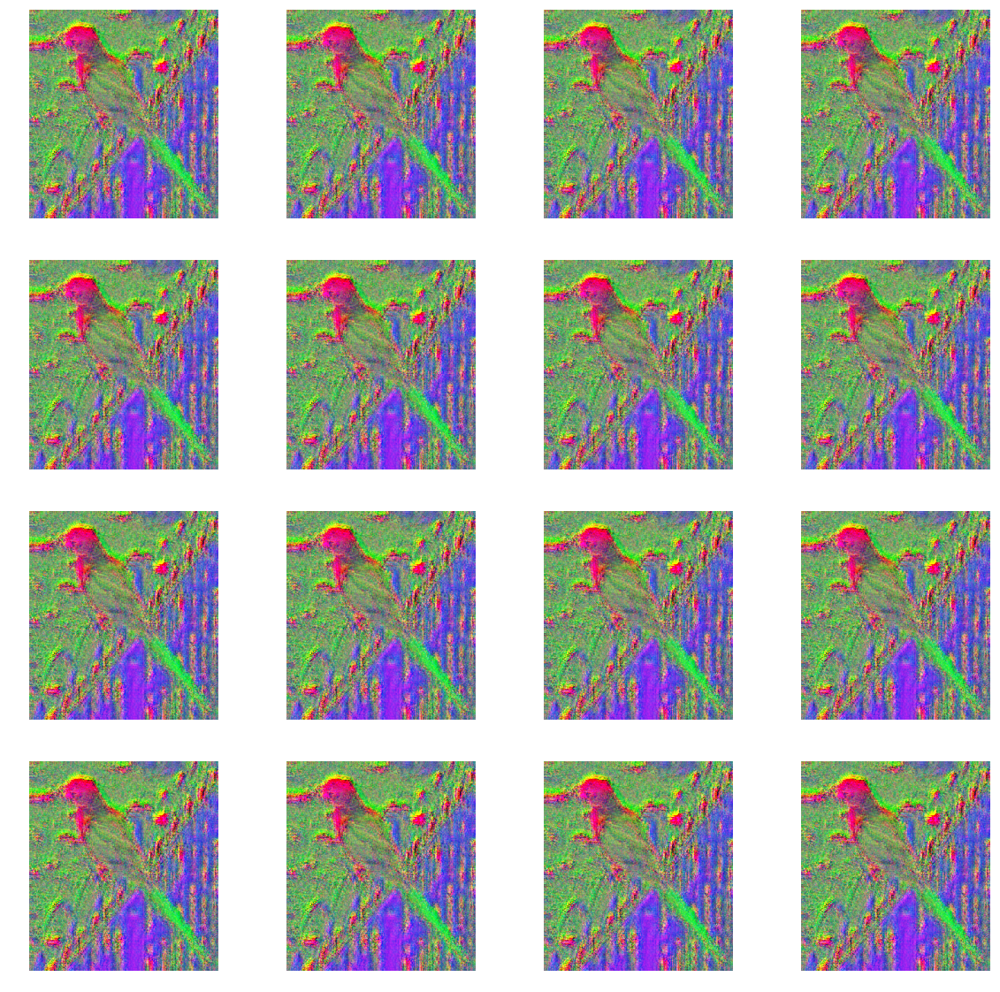

1536110.625, 9438457.0:   0%|          | 50/14786 [00:47<3:24:11,  1.20it/s]  

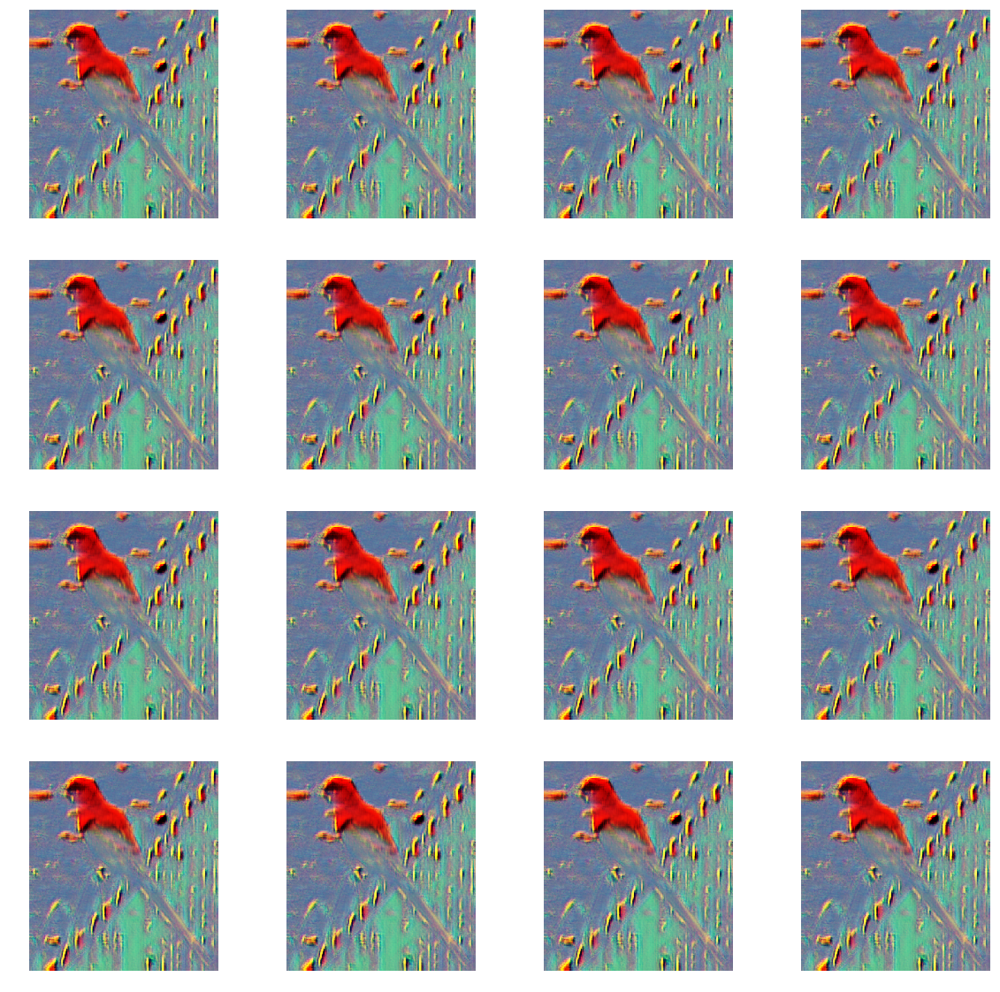

1673802.125, 4824938.5:   1%|          | 100/14786 [01:32<3:14:39,  1.26it/s] 

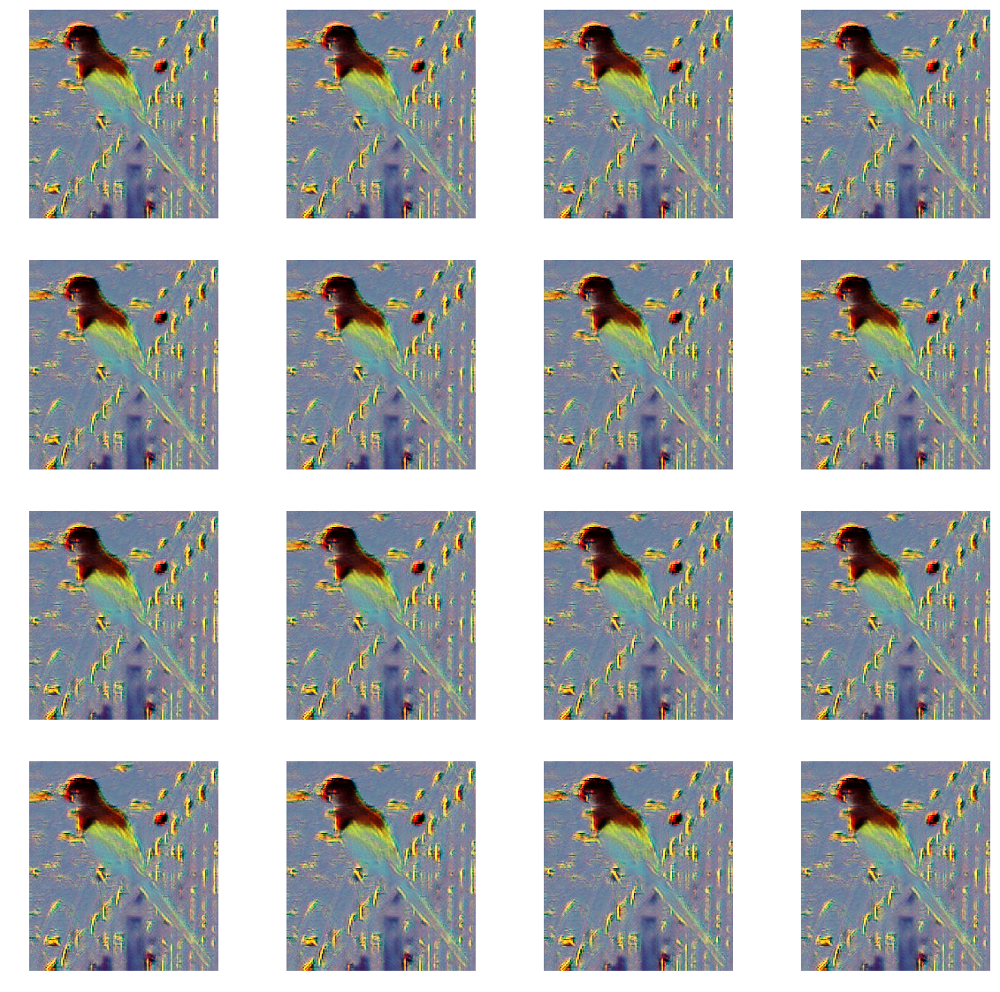

1886269.75, 7145201.5:   1%|          | 150/14786 [02:14<3:14:45,  1.25it/s]   

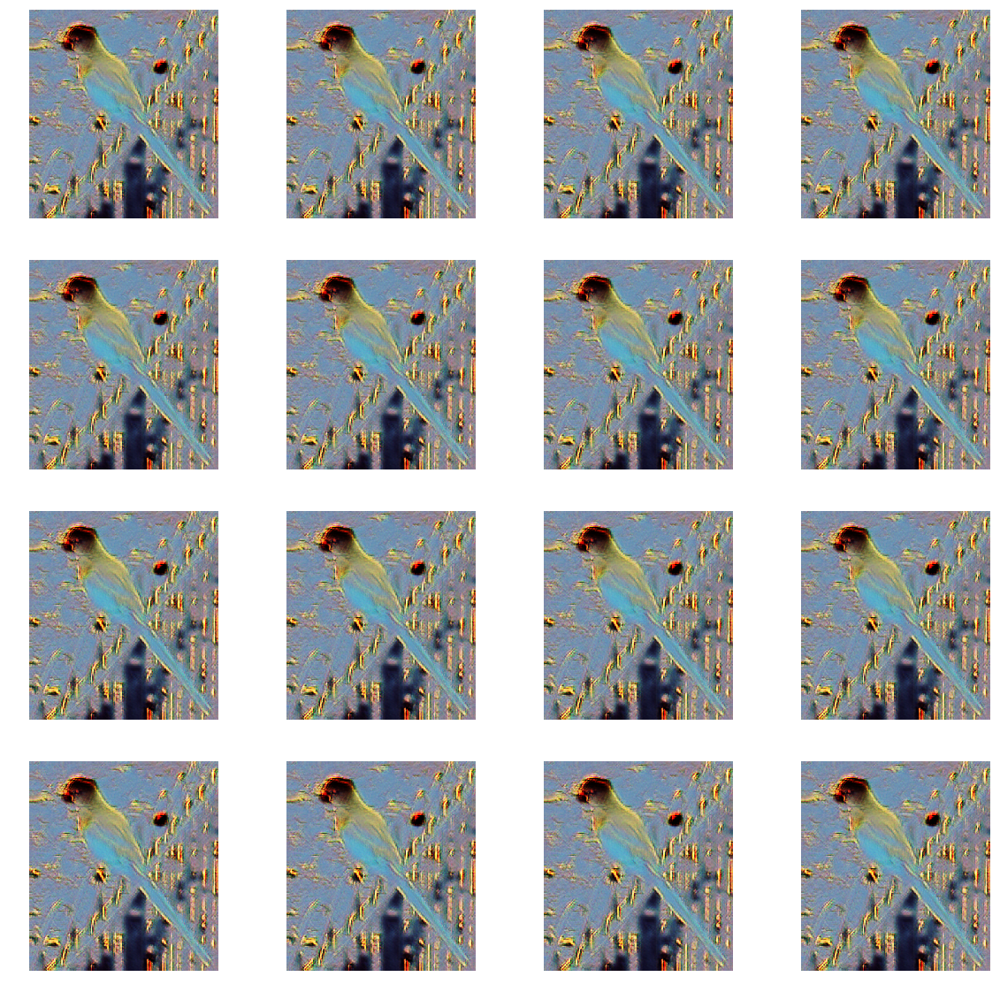

1885964.625, 4055798.25:   1%|▏         | 200/14786 [02:58<3:24:19,  1.19it/s] 

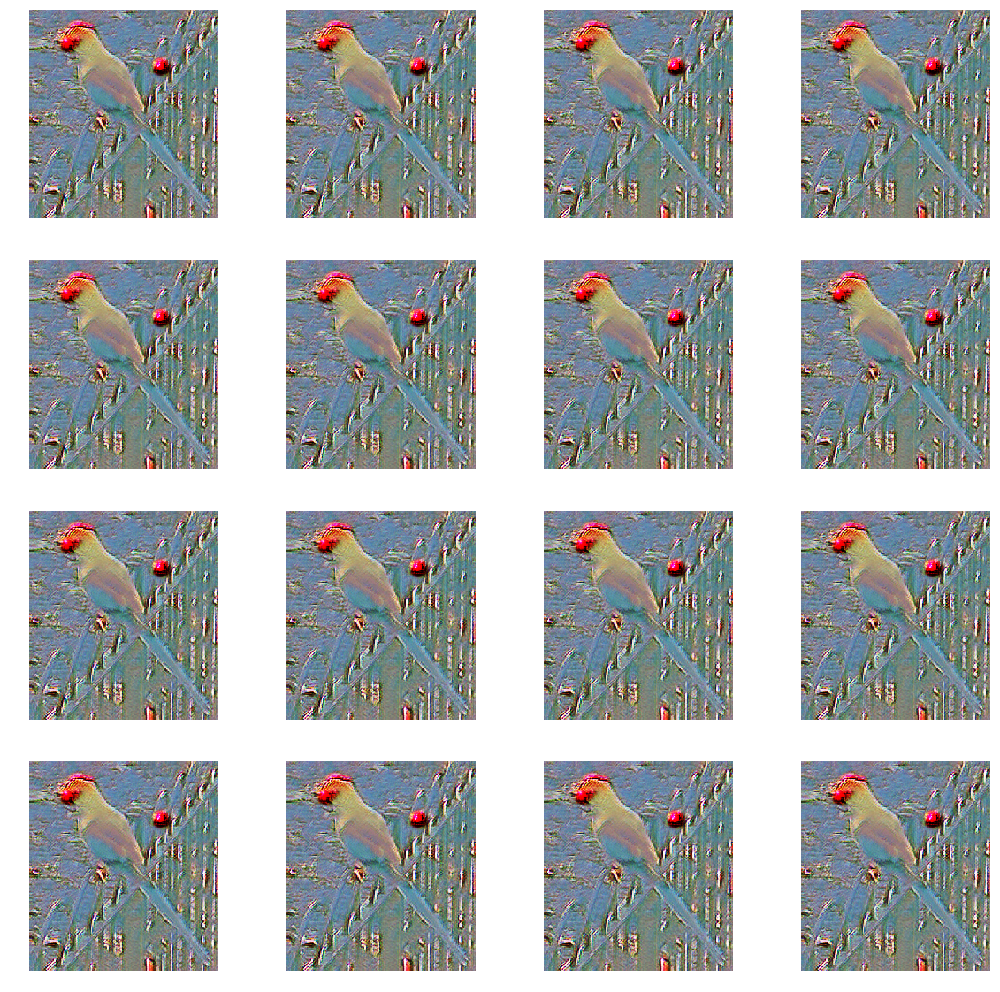

1718258.625, 2961846.25:   2%|▏         | 241/14786 [03:36<3:24:26,  1.19it/s] Exception ignored in: <bound method _DataLoaderIter.__del__ of <torch.utils.data.dataloader._DataLoaderIter object at 0x000002603A56F940>>
Traceback (most recent call last):
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\site-packages\torch\utils\data\dataloader.py", line 717, in __del__
    self._shutdown_workers()
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\site-packages\torch\utils\data\dataloader.py", line 713, in _shutdown_workers
    w.join()
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\multiprocessing\process.py", line 124, in join
    res = self._popen.wait(timeout)
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\multiprocessing\popen_spawn_win32.py", line 80, in wait
    res = _winapi.WaitForSingleObject(int(self._handle), msecs)
KeyboardInterrupt
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\site-packages\IPython\core\interactiveshell.py", line 3267, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-9-4d6a8e4b003f>", line 1, in <module>
    content_loss, style_loss = trainer.train(dataloader, optimizer, epoches, save_dir=model_dir,eval_set=(im,transform))
  File "D:\Repos\style-transfer-2_0\train\Trainer.py", line 78, in train
    optimizer.zero_grad()
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\site-packages\torch\optim\optimizer.py", line 163, in zero_grad
    p.grad.zero_()
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\IDEs\anaconda\envs\pytorchenv\lib\site-packages\IPython\core\interactiveshell.py", line 2018, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of th

KeyboardInterrupt: 

In [9]:
content_loss, style_loss = trainer.train(dataloader, optimizer, epoches, save_dir=model_dir,eval_set=(im,transform))

In [8]:
# trainer.load_model_weights("style16/pastichemodel-FINAL.pth")

In [9]:
trainer.set_mode("eval")

Wall time: 279 ms


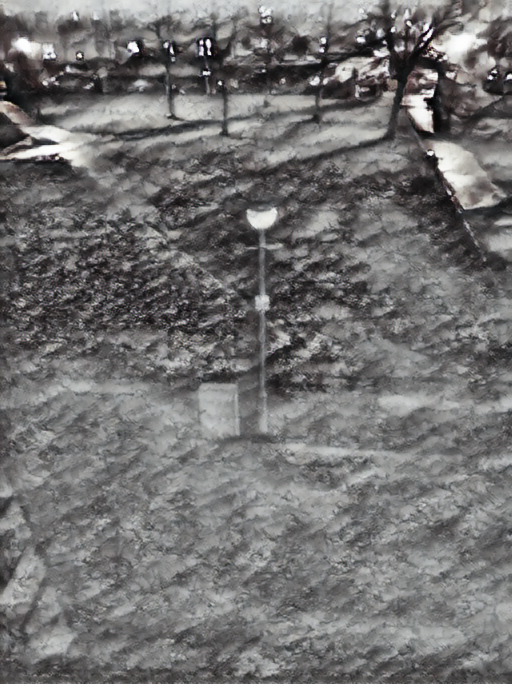

In [10]:
im = Image.open("../profile.jpg").convert('RGB')
transform = transforms.Compose([
        transforms.Resize(512),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
                             std=std)
    ])
%time trainer.eval_image(im, transform, 2)

In [11]:
style_images_dir = glob(os.path.join("transfer_test", '*.jpg'))
style_targets = [vggfmodel.get_style_gram(data_transform(Image.open(style_image_dir).convert('RGB')).unsqueeze(0).to(device)) for style_image_dir in style_images_dir]
pastichemodel = PasticheModel(len(style_targets))
pastichemodel = pastichemodel.to(device)
trainer.transfer_learn_model(pastichemodel, "style16/pastichemodel-FINAL.pth", style_targets)

Wall time: 142 ms


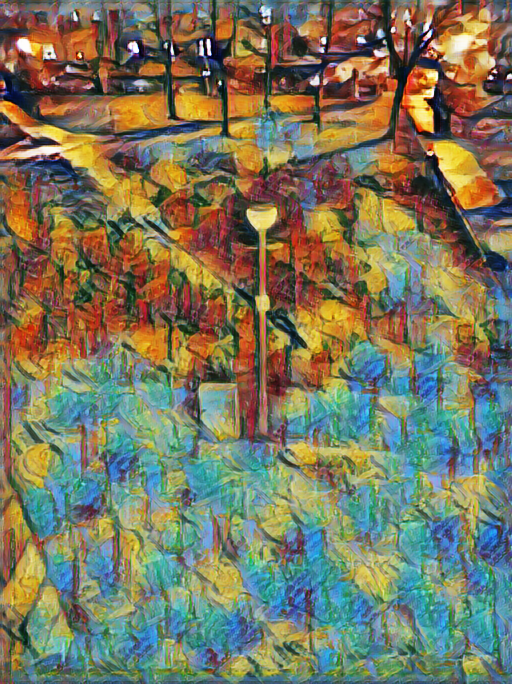

In [12]:
%time trainer.eval_image(im, transform, 2)

In [13]:
optimizer = optim.Adam(pastichemodel.parameters(), lr=0.001, betas=(0.9, 0.999))
content_loss, style_loss = trainer.train(dataloader, optimizer, 1, save_dir=model_dir)

22.93986,48.695633: 100%|██████████| 14786/14786 [2:37:06<00:00,  1.64it/s]   


Wall time: 133 ms


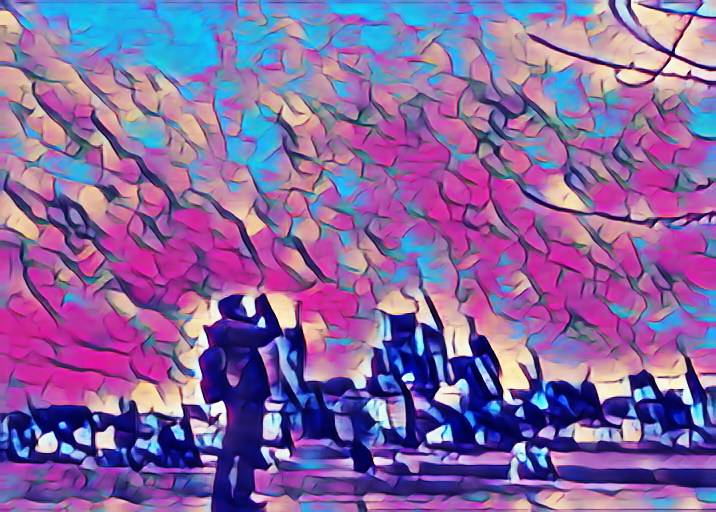

In [26]:
im = Image.open("../profile.jpg").convert('RGB')
%time trainer.eval_image(im, transform, 4)